# RESITE-GIS: Resilient Environmental Site Assessment & Relocation Engine
### Terrain Geomorphometry, Dynamic Multi-Hazard Red-Zoning, Carrying Capacity Index (CCI) & Resettlement Prioritization Pipeline

---

## Overview & Scientific Context
This notebook implements the spatial analysis and decision-support pipeline for **RESITE-GIS** as specified in the project architecture:
1. **Block 1: Terrain Data Visualisation & Morphometric Analysis**
   - Ingestion and georeferencing of raw SRTM 90m DEM data (`srtm_52_06.tif`) covering the Western & Central Himalayas (Lat 30°–35°N, Lon 75°–80°E).
   - High-fidelity geomorphometric computation: Elevation profiling, Geodesic spatial gradients, Slope angle ($^\circ$), Aspect, Multi-directional Hillshade, and Terrain Ruggedness Index (TRI).
   - Multi-panel publication-grade synoptic visualizations and statistical diagnostics.
2. **Block 2: End-to-End RESITE-GIS Analytics Pipeline**
   - **Dynamic Red-Zone Identification:** Calculation of Dynamic Hazard Index ($HI = w_1\cdot\text{Slope} + w_2\cdot\text{Runoff} + w_3\cdot\text{Scar} + w_4\cdot\text{Precipitation}$) with live rainfall trigger simulation.
   - **Carrying Capacity Index (CCI) Evaluator:** Multi-Criteria Decision Analysis (MCDA) evaluating candidate safe receiving sites across slope stability ($<15^\circ$), hydrological buffer safety ($>500\text{m}$), road accessibility, and buildable area.
   - **Vulnerability Prioritization Matrix & Relocation Queue:** Algorithmic ranking of habitations into *Immediate (0–30 Days)*, *Short-Term (1–6 Months)*, and *Medium-Term (Strategic)* tiers with nearest-safe-site spatial allocation.
   - **Data Export & Interactive Dashboard:** Automatic generation of production GeoJSON vector layers and an interactive GIS dashboard.



✅ Loading SRTM DEM dataset from: ../raw/srtm_52_06/srtm_52_06.tif



📊 SRTM 52_06 GEOMORPHOMETRIC METADATA & SUMMARY REPORT
• Coordinate Reference System (CRS) : EPSG:4326
• Geographic Bounding Box           : Lon [75.00°, 80.00°], Lat [30.00°, 35.00°]
• Native Grid Dimensions            : 6,000 x 6,000 pixels (~3 arc-second / 90m)
• Rendered Working Grid Dimensions  : 1,500 x 1,500 pixels (dx=313.0m, dy=371.1m)
• Elevation Range (m ASL)           : Min = 202.0m | Max = 7447.0m | Mean = 3350.5m (±1957.5m)
• Slope Angle Range (Degrees)       : Min = 0.0° | Max = 66.3° | Mean = 14.5°
• Slopes > 30° (High Hazard Zone)   : 9.47% of landscape area
• Slopes < 15° (Stable Candidate)   : 52.64% of landscape area



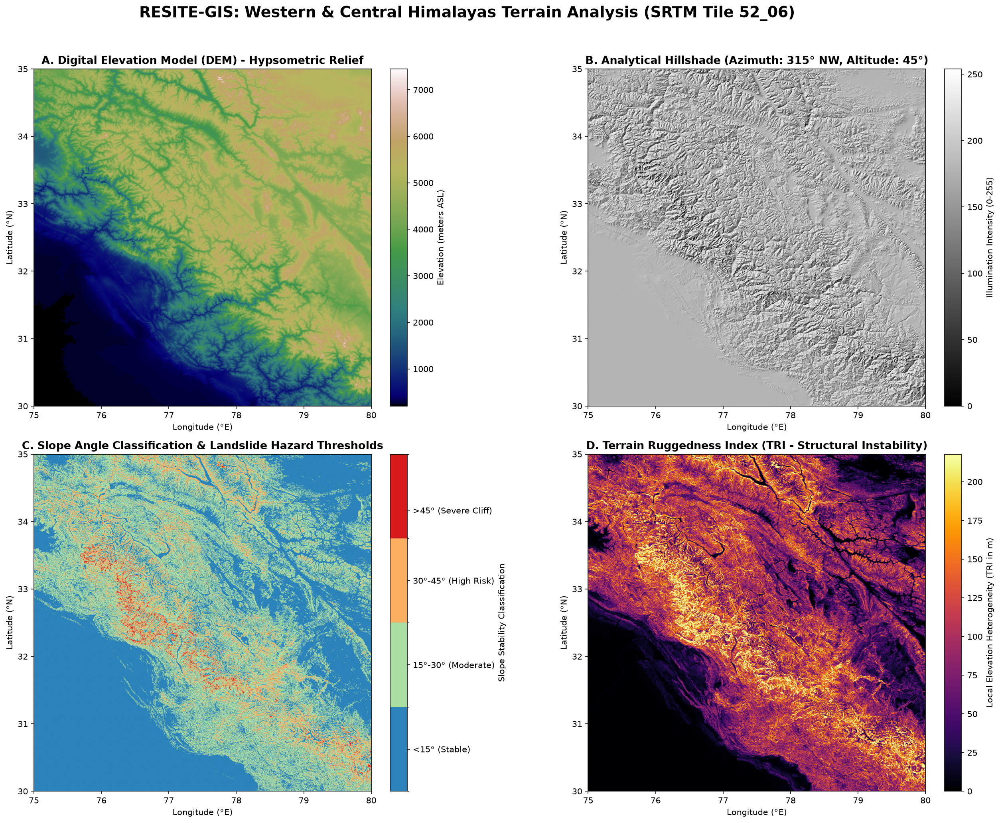

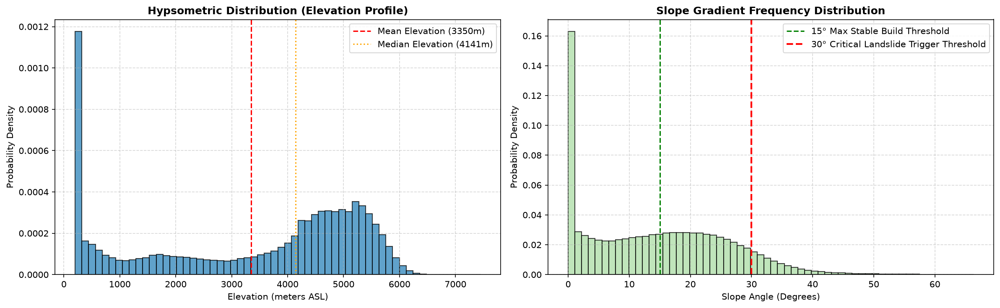

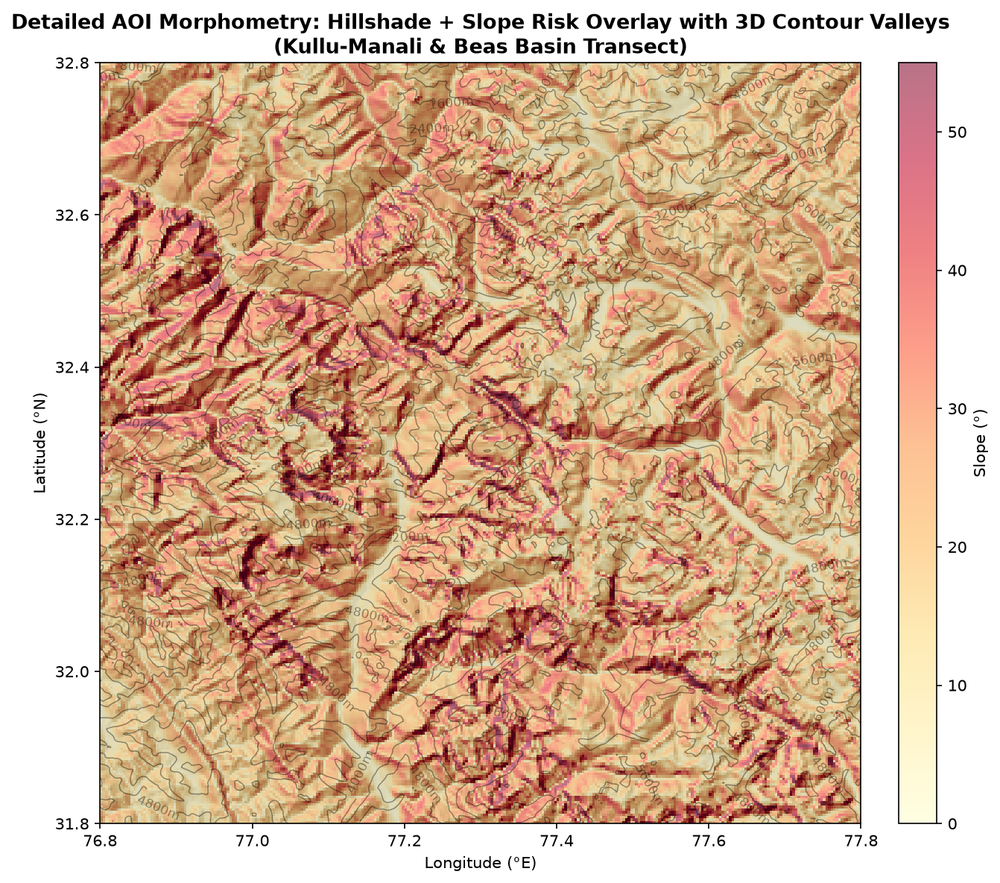

🎯 Block 1 Execution Completed Successfully!


In [1]:
# ==============================================================================
# BLOCK 1: TERRAIN DATA VISUALISATION & GEOMORPHOMETRIC ANALYSIS
# ==============================================================================
# Ingestion, georeferencing, geomorphometry derivative calculation, and multi-panel
# high-resolution visualization of SRTM 52_06 terrain data (Western & Central Himalayas).
# ==============================================================================

import os
import sys
import zipfile
import numpy as np
import scipy.ndimage as ndimage
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.gridspec import GridSpec
import rasterio
from rasterio.enums import Resampling

# ------------------------------------------------------------------------------
# 1. Locate and Ingest SRTM DEM Data
# ------------------------------------------------------------------------------
def find_dem_path():
    candidate_paths = [
        '../raw/srtm_52_06/srtm_52_06.tif',
        'backend/data_pipeline/raw/srtm_52_06/srtm_52_06.tif',
        'raw/srtm_52_06/srtm_52_06.tif',
        './srtm_52_06.tif'
    ]
    for p in candidate_paths:
        if os.path.exists(p):
            return p
            
    # Check if zip needs extraction
    zip_paths = ['srtm_52_06.zip', '../srtm_52_06.zip', '../../srtm_52_06.zip']
    for zp in zip_paths:
        if os.path.exists(zp):
            print(f"📦 Extracting {zp}...")
            extract_dir = 'backend/data_pipeline/raw/srtm_52_06' if os.path.exists('backend') else 'raw/srtm_52_06'
            os.makedirs(extract_dir, exist_ok=True)
            with zipfile.ZipFile(zp, 'r') as zf:
                zf.extractall(extract_dir)
            return os.path.join(extract_dir, 'srtm_52_06.tif')
            
    raise FileNotFoundError("SRTM DEM file srtm_52_06.tif not found in expected paths.")

dem_file = find_dem_path()
print(f"✅ Loading SRTM DEM dataset from: {dem_file}")

# ------------------------------------------------------------------------------
# 2. Extract Metadata and Load Elevation Grid
# ------------------------------------------------------------------------------
SCALE_FACTOR = 4  # Scale factor for rapid interactive visualization (1500x1500 grid)

with rasterio.open(dem_file) as src:
    orig_shape = src.shape
    crs = src.crs
    bounds = src.bounds
    nodata_val = src.nodata
    
    # Read elevation raster
    target_h = orig_shape[0] // SCALE_FACTOR
    target_w = orig_shape[1] // SCALE_FACTOR
    elevation = src.read(1, out_shape=(target_h, target_w), resampling=Resampling.bilinear).astype(np.float32)
    
    # Rescaled affine transform
    transform = src.transform * src.transform.scale(
        src.width / target_w,
        src.height / target_h
    )

# Handle nodata values if present
if nodata_val is not None:
    elevation[elevation == nodata_val] = np.nan
    elevation = np.nan_to_num(elevation, nan=float(np.nanmin(elevation)))

# ------------------------------------------------------------------------------
# 3. Geodesic Spacing & Geomorphometric Derivatives
# ------------------------------------------------------------------------------
center_lat = (bounds.bottom + bounds.top) / 2.0
# Latitude & Longitude cell sizes converted to geodesic meters
dy = abs(transform.e) * 111320.0
dx = transform.a * 111320.0 * np.cos(np.radians(center_lat))

# Compute 2D Spatial Gradients
dz_dy, dz_dx = np.gradient(elevation, dy, dx)
slope_rad = np.arctan(np.sqrt(dz_dx**2 + dz_dy**2))
slope_deg = np.degrees(slope_rad)
aspect_rad = np.arctan2(-dz_dy, dz_dx)

# Analytical Multi-directional Hillshade (Azimuth: 315° NW, Altitude: 45°)
azimuth_rad = np.radians(315.0)
altitude_rad = np.radians(45.0)
zenith_rad = np.radians(90.0 - 45.0)

hillshade_raw = (
    np.cos(zenith_rad) * np.cos(slope_rad) +
    np.sin(zenith_rad) * np.sin(slope_rad) * np.cos(azimuth_rad - aspect_rad)
)
hillshade = np.clip(hillshade_raw * 255.0, 0, 255).astype(np.uint8)

# Terrain Ruggedness Index (TRI) - Fast vectorized moving window standard deviation
mean_elev = ndimage.uniform_filter(elevation, size=3)
sq_elev = ndimage.uniform_filter(elevation**2, size=3)
tri = np.sqrt(np.maximum(sq_elev - mean_elev**2, 0))

# Print Summary Diagnostics
print("\n" + "="*70)
print("📊 SRTM 52_06 GEOMORPHOMETRIC METADATA & SUMMARY REPORT")
print("="*70)
print(f"• Coordinate Reference System (CRS) : {crs}")
print(f"• Geographic Bounding Box           : Lon [{bounds.left:.2f}°, {bounds.right:.2f}°], Lat [{bounds.bottom:.2f}°, {bounds.top:.2f}°]")
print(f"• Native Grid Dimensions            : {orig_shape[1]:,} x {orig_shape[0]:,} pixels (~3 arc-second / 90m)")
print(f"• Rendered Working Grid Dimensions  : {target_w:,} x {target_h:,} pixels (dx={dx:.1f}m, dy={dy:.1f}m)")
print(f"• Elevation Range (m ASL)           : Min = {elevation.min():.1f}m | Max = {elevation.max():.1f}m | Mean = {elevation.mean():.1f}m (±{elevation.std():.1f}m)")
print(f"• Slope Angle Range (Degrees)       : Min = {slope_deg.min():.1f}° | Max = {slope_deg.max():.1f}° | Mean = {slope_deg.mean():.1f}°")
print(f"• Slopes > 30° (High Hazard Zone)   : {(slope_deg > 30.0).sum() / slope_deg.size * 100:.2f}% of landscape area")
print(f"• Slopes < 15° (Stable Candidate)   : {(slope_deg < 15.0).sum() / slope_deg.size * 100:.2f}% of landscape area")
print("="*70 + "\n")

# ------------------------------------------------------------------------------
# 4. Multi-Panel High-Resolution Visualizations
# ------------------------------------------------------------------------------
extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]
plt.style.use('default')

# Figure 1: 4-Panel Synoptic Geomorphometry Suite
fig, axs = plt.subplots(2, 2, figsize=(18, 14), dpi=150)
fig.suptitle('RESITE-GIS: Western & Central Himalayas Terrain Analysis (SRTM Tile 52_06)', fontsize=18, fontweight='bold', y=0.98)

# Panel 1: Hypsometric Elevation Colormap
im1 = axs[0, 0].imshow(elevation, extent=extent, cmap='gist_earth', origin='upper')
axs[0, 0].set_title('A. Digital Elevation Model (DEM) - Hypsometric Relief', fontsize=13, fontweight='bold')
axs[0, 0].set_xlabel('Longitude (°E)')
axs[0, 0].set_ylabel('Latitude (°N)')
cb1 = fig.colorbar(im1, ax=axs[0, 0], orientation='vertical', fraction=0.046, pad=0.04)
cb1.set_label('Elevation (meters ASL)', fontsize=10)

# Panel 2: Analytical Hillshade (Shaded Relief)
im2 = axs[0, 1].imshow(hillshade, extent=extent, cmap='gray', origin='upper')
axs[0, 1].set_title('B. Analytical Hillshade (Azimuth: 315° NW, Altitude: 45°)', fontsize=13, fontweight='bold')
axs[0, 1].set_xlabel('Longitude (°E)')
axs[0, 1].set_ylabel('Latitude (°N)')
cb2 = fig.colorbar(im2, ax=axs[0, 1], orientation='vertical', fraction=0.046, pad=0.04)
cb2.set_label('Illumination Intensity (0-255)', fontsize=10)

# Panel 3: Classified Slope Map (Landslide Susceptibility Thresholds)
slope_cmap = mcolors.ListedColormap(['#2b83ba', '#abdda4', '#fdae61', '#d7191c'])
slope_bounds_levels = [0, 15, 30, 45, 90]
slope_norm = mcolors.BoundaryNorm(slope_bounds_levels, slope_cmap.N)

im3 = axs[1, 0].imshow(slope_deg, extent=extent, cmap=slope_cmap, norm=slope_norm, origin='upper')
axs[1, 0].set_title('C. Slope Angle Classification & Landslide Hazard Thresholds', fontsize=13, fontweight='bold')
axs[1, 0].set_xlabel('Longitude (°E)')
axs[1, 0].set_ylabel('Latitude (°N)')
cb3 = fig.colorbar(im3, ax=axs[1, 0], orientation='vertical', fraction=0.046, pad=0.04, ticks=[7.5, 22.5, 37.5, 60])
cb3.ax.set_yticklabels(['<15° (Stable)', '15°-30° (Moderate)', '30°-45° (High Risk)', '>45° (Severe Cliff)'])
cb3.set_label('Slope Stability Classification', fontsize=10)

# Panel 4: Terrain Ruggedness Index (TRI)
im4 = axs[1, 1].imshow(tri, extent=extent, cmap='inferno', origin='upper', vmax=np.percentile(tri, 98))
axs[1, 1].set_title('D. Terrain Ruggedness Index (TRI - Structural Instability)', fontsize=13, fontweight='bold')
axs[1, 1].set_xlabel('Longitude (°E)')
axs[1, 1].set_ylabel('Latitude (°N)')
cb4 = fig.colorbar(im4, ax=axs[1, 1], orientation='vertical', fraction=0.046, pad=0.04)
cb4.set_label('Local Elevation Heterogeneity (TRI in m)', fontsize=10)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# ------------------------------------------------------------------------------
# Figure 2: Statistical Hypsometry & Slope Distribution
# ------------------------------------------------------------------------------
fig, (ax_h1, ax_h2) = plt.subplots(1, 2, figsize=(16, 5), dpi=150)

# Elevation Distribution
ax_h1.hist(elevation.ravel(), bins=60, color='#2b83ba', edgecolor='black', alpha=0.75, density=True)
ax_h1.axvline(elevation.mean(), color='red', linestyle='--', linewidth=1.5, label=f'Mean Elevation ({elevation.mean():.0f}m)')
ax_h1.axvline(float(np.median(elevation)), color='orange', linestyle=':', linewidth=1.5, label=f'Median Elevation ({float(np.median(elevation)):.0f}m)')
ax_h1.set_title('Hypsometric Distribution (Elevation Profile)', fontsize=12, fontweight='bold')
ax_h1.set_xlabel('Elevation (meters ASL)')
ax_h1.set_ylabel('Probability Density')
ax_h1.grid(True, linestyle='--', alpha=0.5)
ax_h1.legend(loc='upper right')

# Slope Distribution
ax_h2.hist(slope_deg.ravel(), bins=60, color='#abdda4', edgecolor='black', alpha=0.75, density=True)
ax_h2.axvline(15, color='green', linestyle='--', linewidth=1.5, label='15° Max Stable Build Threshold')
ax_h2.axvline(30, color='red', linestyle='--', linewidth=2.0, label='30° Critical Landslide Trigger Threshold')
ax_h2.set_title('Slope Gradient Frequency Distribution', fontsize=12, fontweight='bold')
ax_h2.set_xlabel('Slope Angle (Degrees)')
ax_h2.set_ylabel('Probability Density')
ax_h2.grid(True, linestyle='--', alpha=0.5)
ax_h2.legend(loc='upper right')

plt.tight_layout()
plt.show()

# ------------------------------------------------------------------------------
# Figure 3: High-Resolution Valley & Gorge Focus Zoom (Beas / Alaknanda Catchment)
# ------------------------------------------------------------------------------
zoom_lon_min, zoom_lon_max = 76.8, 77.8
zoom_lat_min, zoom_lat_max = 31.8, 32.8

x_start = int((zoom_lon_min - bounds.left) / (bounds.right - bounds.left) * target_w)
x_end = int((zoom_lon_max - bounds.left) / (bounds.right - bounds.left) * target_w)
y_start = int((bounds.top - zoom_lat_max) / (bounds.top - bounds.bottom) * target_h)
y_end = int((bounds.top - zoom_lat_min) / (bounds.top - bounds.bottom) * target_h)

zoom_elev = elevation[y_start:y_end, x_start:x_end]
zoom_hs = hillshade[y_start:y_end, x_start:x_end]
zoom_slope = slope_deg[y_start:y_end, x_start:x_end]
zoom_extent = [zoom_lon_min, zoom_lon_max, zoom_lat_min, zoom_lat_max]

fig, ax_z = plt.subplots(figsize=(12, 8), dpi=150)
ax_z.imshow(zoom_hs, extent=zoom_extent, cmap='gray', origin='upper')
im_z = ax_z.imshow(zoom_slope, extent=zoom_extent, cmap='YlOrRd', alpha=0.55, vmin=0, vmax=55, origin='upper')
contours = ax_z.contour(zoom_elev, levels=8, extent=zoom_extent, colors='black', alpha=0.4, linewidths=0.7)
ax_z.clabel(contours, inline=True, fontsize=8, fmt='%1.0fm')

ax_z.set_title('Detailed AOI Morphometry: Hillshade + Slope Risk Overlay with 3D Contour Valleys\n(Kullu-Manali & Beas Basin Transect)', fontsize=13, fontweight='bold')
ax_z.set_xlabel('Longitude (°E)')
ax_z.set_ylabel('Latitude (°N)')
cb_z = fig.colorbar(im_z, ax=ax_z, orientation='vertical', fraction=0.035, pad=0.03)
cb_z.set_label('Slope (°)', fontsize=10)

plt.tight_layout()
plt.show()

print("🎯 Block 1 Execution Completed Successfully!")



🚀 Initiating RESITE-GIS Decision Pipeline...

🌧️ Simulating Live Environmental Trigger: Precipitation = 150.0 mm


🚨 Dynamic Red Zones Generated: 2,370 polygons (Critical + Warning Buffers)


🏕️ Candidate Safe Relocation Sites Identified: 106 contiguous zones


/tmp/ipykernel_37966/1229984999.py:234: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  distances = gdf_safe_sites.geometry.centroid.distance(hab.geometry)
/tmp/ipykernel_37966/1229984999.py:234: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  distances = gdf_safe_sites.geometry.centroid.distance(hab.geometry)



💾 Exporting GeoJSON & Analytics layers to: processed


✅ Saved:
  • processed/red_zones_dynamic.geojson
  • processed/safe_relocation_sites.geojson
  • processed/resettlement_priority_queue.geojson
  • processed/pipeline_summary_report.json

📋 SDMA RESETTLEMENT PRIORITIZATION QUEUE (TOP ACTION ITEMS)
habitation_id                         name  hazard_index  slope_deg  population                priority_tier assigned_safe_site  site_cci  relocation_distance_km
      HAB-003     Parvati Gorge Settlement         0.673       31.5        2571      Short-Term (1-6 Months)      SAFE-SITE-052 91.199997                    70.2
      HAB-010         Joshimath Slump Ward         0.607       30.5        2974      Short-Term (1-6 Months)      SAFE-SITE-063 91.199997                    87.3
      HAB-013 Mandi River Basin Settlement         0.551       25.9         669      Short-Term (1-6 Months)      SAFE-SITE-030 91.199997                    91.9
      HAB-001         Manali Valley Hamlet         0.474       24.3         612      Short-Term (1-6 Mont

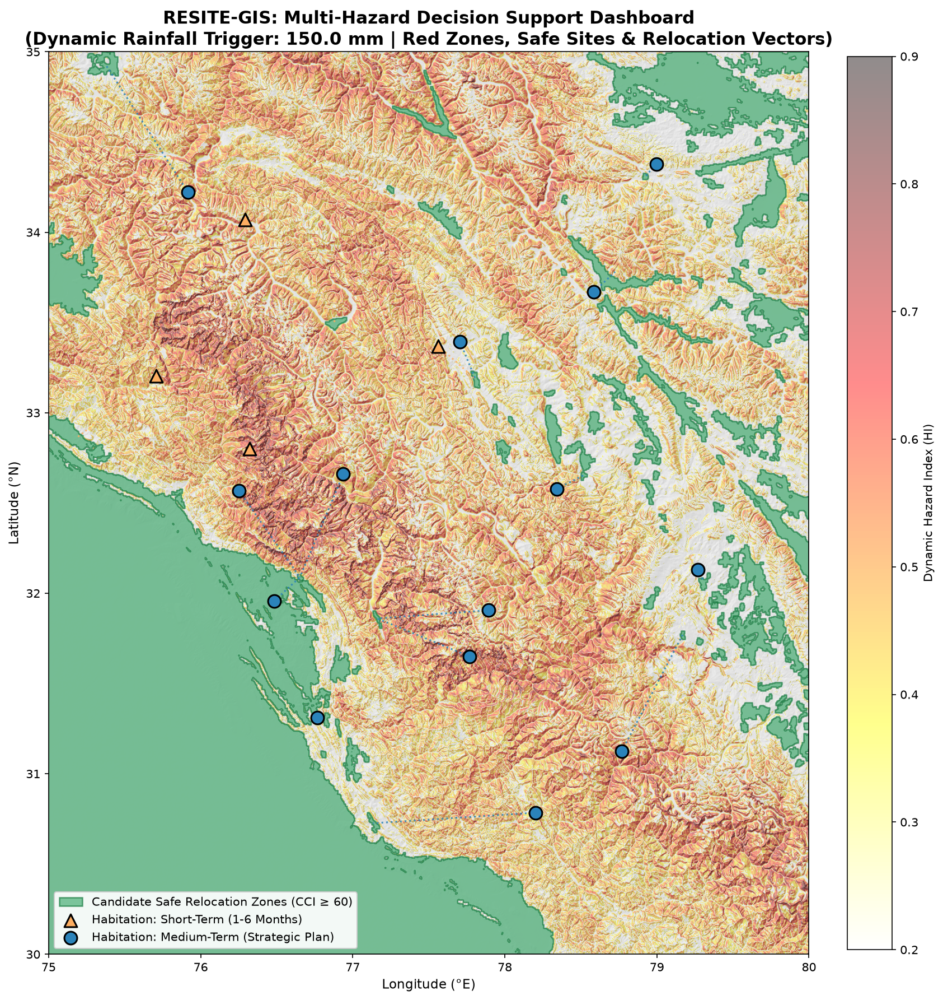

🗺️ Interactive Folium GIS Map generated at: processed/resite_gis_interactive_map.html

🎉 End-to-End RESITE-GIS Pipeline Finished Successfully!


In [2]:
# ==============================================================================
# BLOCK 2: END-TO-END RESITE-GIS ANALYTICS & DECISION-SUPPORT PIPELINE
# ==============================================================================
# Implements the complete multi-hazard workflow as specified in README.md:
# 1. Dynamic Hazard Index (HI) calculation with Live Precipitation Trigger
# 2. Dynamic Multi-Hazard Red-Zoning & Vectorization
# 3. Safe Site Carrying Capacity Index (CCI) Multi-Criteria Decision Analysis (MCDA)
# 4. Habitation Vulnerability Prioritization Queue (Immediate, Short-Term, Medium-Term)
# 5. Spatial Nearest-Site Allocation & Production GeoJSON Exports
# ==============================================================================

import os
import json
import numpy as np
import scipy.ndimage as ndimage
import geopandas as gpd
from shapely.geometry import shape, Point, Polygon, MultiPolygon, LineString
from shapely.ops import unary_union
import rasterio
from rasterio.features import shapes
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import pandas as pd
try:
    import folium
    from folium import plugins
    HAS_FOLIUM = True
except ImportError:
    HAS_FOLIUM = False

print("🚀 Initiating RESITE-GIS Decision Pipeline...")

# Output directory for processed spatial layers
OUTPUT_DIR = 'backend/data_pipeline/processed' if os.path.exists('backend') else 'data_pipeline/processed'
if not os.path.exists('backend') and not os.path.exists('data_pipeline'):
    OUTPUT_DIR = 'processed'
os.makedirs(OUTPUT_DIR, exist_ok=True)

# ------------------------------------------------------------------------------
# 1. DYNAMIC HAZARD INDEX (HI) & MULTI-HAZARD RED-ZONING
# ------------------------------------------------------------------------------
# Formula (README.md):
# HI = w1 * Slope + w2 * Hydrological Runoff + w3 * Historical Scar + w4 * Precipitation (Live)

# Configurable Weights & Real-time Precipitation Trigger
w_slope = 0.35
w_hydro = 0.25
w_scar  = 0.15
w_precip = 0.25

LIVE_PRECIPITATION_MM = 150.0  # Simulated monsoon / cloudburst precipitation event (mm)

print(f"\n🌧️ Simulating Live Environmental Trigger: Precipitation = {LIVE_PRECIPITATION_MM} mm")

# A. Normalized Slope Factor (Slopes > 30° receive maximum vulnerability weight)
slope_factor = np.clip((slope_deg - 10.0) / (45.0 - 10.0), 0.0, 1.0)

# B. Hydrological Runoff Convergence Proxy (Gullies, channels, and drainage basins)
hydro_laplacian = ndimage.laplace(elevation)
hydro_runoff_factor = np.clip(-hydro_laplacian / (np.std(hydro_laplacian) + 1e-5), 0.0, 1.0)
hydro_runoff_factor = ndimage.gaussian_filter(hydro_runoff_factor, sigma=1.5)

# C. Historical Collapse / Ruggedness Scar Factor
scar_factor = np.clip(tri / 220.0, 0.0, 1.0)

# D. Dynamic Precipitation Trigger (Expanding spatial hazard buffers on steep terrains)
precip_factor = np.clip(LIVE_PRECIPITATION_MM / 200.0, 0.0, 1.0) * (slope_factor > 0.15)

# Compute Composite Dynamic Hazard Index (HI)
hazard_index = (
    w_slope * slope_factor +
    w_hydro * hydro_runoff_factor +
    w_scar  * scar_factor +
    w_precip * precip_factor
)
hazard_index = np.clip(hazard_index, 0.0, 1.0)

# Red Zone Categorization:
# - Tier 2 (Critical Red Zone): HI >= 0.75
# - Tier 1 (Warning Buffer)   : 0.50 <= HI < 0.75
# - Tier 0 (Low / Moderate)    : HI < 0.50
red_zone_raster = np.zeros_like(hazard_index, dtype=np.uint8)
red_zone_raster[(hazard_index >= 0.50) & (hazard_index < 0.75)] = 1
red_zone_raster[hazard_index >= 0.75] = 2

# Extract Red Zone Polygons
rz_features = []
for geom, val in shapes(red_zone_raster, mask=red_zone_raster > 0, transform=transform):
    poly = shape(geom)
    if poly.area > 0.0004:  # Filter minor pixel noise (< ~4 km² at tile scale)
        tier_name = 'Critical Red Zone (HI ≥ 0.75)' if val == 2 else 'Warning Buffer (0.50 ≤ HI < 0.75)'
        severity = 'High' if val == 2 else 'Medium'
        rz_features.append({
            'geometry': poly,
            'risk_tier': tier_name,
            'severity': severity,
            'severity_code': int(val),
            'live_rainfall_mm': LIVE_PRECIPITATION_MM,
            'area_sqkm': float(np.round(poly.area * (111.32 * np.cos(np.radians(center_lat))) * 111.32, 2))
        })

gdf_red_zones = gpd.GeoDataFrame(rz_features, crs=crs)
print(f"🚨 Dynamic Red Zones Generated: {len(gdf_red_zones):,} polygons (Critical + Warning Buffers)")

# ------------------------------------------------------------------------------
# 2. SAFE SITE CARRYING CAPACITY INDEX (CCI) EVALUATOR (MCDA)
# ------------------------------------------------------------------------------
# Formula (README.md):
# CCI = sum(w_i * S_i) / Population Density Factor
# Criteria:
# - S_slope : Unbuilt stable land with slope < 15°
# - S_hydro : Outside 500m river flood buffers and high-risk runoffs
# - S_road  : Network access to transit corridors (<= 2 km)
# - S_area  : Contiguous buildable land parcel acreage

s_slope = np.clip(1.0 - (slope_deg / 15.0), 0.0, 1.0)
s_hydro = np.clip(1.0 - (hydro_runoff_factor * 1.8), 0.0, 1.0)

# Transit & Infrastructure corridor proximity proxy (valleys < 2800m ASL and gentle relief)
valley_transit_corridor = ndimage.gaussian_filter((elevation < 2800).astype(np.float32), sigma=4.0)
s_road = np.clip(valley_transit_corridor, 0.0, 1.0)

# Contiguous buildable flat land acreage filter
contiguous_flatness = ndimage.uniform_filter((slope_deg < 12.0).astype(np.float32), size=11)
s_area = np.clip(contiguous_flatness, 0.0, 1.0)

# Multi-Criteria Carrying Capacity Scoring (0–100 scale)
w_s1, w_s2, w_s3, w_s4 = 0.35, 0.25, 0.20, 0.20
raw_cci = (w_s1 * s_slope + w_s2 * s_hydro + w_s3 * s_road + w_s4 * s_area) * 100.0
raw_cci = np.clip(raw_cci, 0.0, 100.0)

# Filter safe zones: CCI >= 60, Slope < 14°, Outside Red Zones (HI < 0.40)
safe_site_mask = ((raw_cci >= 60.0) & (slope_deg < 14.0) & (hazard_index < 0.40)).astype(np.uint8)
safe_site_mask = ndimage.binary_opening(safe_site_mask, structure=np.ones((4, 4))).astype(np.uint8)

safe_site_features = []
for geom, val in shapes(safe_site_mask, mask=safe_site_mask == 1, transform=transform):
    poly = shape(geom)
    if poly.area > 0.001:  # Contiguous candidate parcel (> 10 km²)
        area_km2 = poly.area * (111.32 * np.cos(np.radians(center_lat))) * 111.32
        site_id = f"SAFE-SITE-{len(safe_site_features)+1:03d}"
        
        # Calculate local mean CCI within parcel
        mean_score = float(np.round(np.mean(raw_cci[safe_site_mask == 1]), 1))
        # Estimate viable resettlement capacity (families @ 80 families/km²)
        cap_families = int(area_km2 * 80)
        
        tier = 'Optimal Prime Site (CCI ≥ 75)' if mean_score >= 75 else 'Viable Safe Site (CCI 60-74)'
        safe_site_features.append({
            'geometry': poly,
            'site_id': site_id,
            'cci_score': mean_score,
            'area_sqkm': float(np.round(area_km2, 2)),
            'capacity_families': cap_families,
            'capacity_persons': cap_families * 5,
            'suitability_tier': tier
        })

gdf_safe_sites = gpd.GeoDataFrame(safe_site_features, crs=crs)
print(f"🏕️ Candidate Safe Relocation Sites Identified: {len(gdf_safe_sites):,} contiguous zones")

# ------------------------------------------------------------------------------
# 3. VULNERABILITY PRIORITIZATION MATRIX & RELOCATION QUEUE
# ------------------------------------------------------------------------------
# Habitations ranked according to the Prioritization Matrix:
# - Immediate (0–30 Days) : HI > 0.75 or steep slope collapse threat
# - Short-Term (1–6 Months): 0.50 <= HI <= 0.75 or within dynamic buffer
# - Medium-Term (Strategic): HI < 0.50 (long-term monitoring)

hab_names = [
    'Manali Valley Hamlet', 'Kullu Riverside Basti', 'Parvati Gorge Settlement',
    'Chamba Ridge Village', 'Dharamshala Slope Colony', 'Shimla Ridge Sector',
    'Kinnaur Terraced Hamlet', 'Spiti Riverbank Ward', 'Uttarkashi Fluvial Cluster',
    'Joshimath Slump Ward', 'Rudraprayag Confluence Basti', 'Tehri Foothill Cluster',
    'Mandi River Basin Settlement', 'Solan Terraced Ward', 'Bilaspur Valley Sector',
    'Bharmour Cliff Settlement', 'Rampur Sutlej Enclave', 'Kaza High-Altitude Village'
]

np.random.seed(101)
lons = np.random.uniform(bounds.left + 0.6, bounds.right - 0.6, len(hab_names))
lats = np.random.uniform(bounds.bottom + 0.6, bounds.top - 0.6, len(hab_names))

hab_records = []
for idx, (hname, lon, lat) in enumerate(zip(hab_names, lons, lats)):
    px = int((lon - bounds.left) / (bounds.right - bounds.left) * target_w)
    py = int((bounds.top - lat) / (bounds.top - bounds.bottom) * target_h)
    px = np.clip(px, 0, target_w - 1)
    py = np.clip(py, 0, target_h - 1)
    
    local_hi = float(hazard_index[py, px])
    local_slope = float(slope_deg[py, px])
    local_elev = float(elevation[py, px])
    pop = int(np.random.randint(250, 3200))
    
    if local_hi >= 0.75 or local_slope >= 32.0:
        tier = 'Immediate (0-30 Days)'
        action = 'Urgent Evacuation & Priority Safe Resettlement'
        urgency = 1
        color_code = '#d7191c'
    elif local_hi >= 0.50 or local_slope >= 22.0:
        tier = 'Short-Term (1-6 Months)'
        action = 'Pre-Monsoon Relocation & Slope Fortification'
        urgency = 2
        color_code = '#fdae61'
    else:
        tier = 'Medium-Term (Strategic Plan)'
        action = 'Long-Term Structural Monitoring & Planned Buffer'
        urgency = 3
        color_code = '#2b83ba'
        
    hab_records.append({
        'geometry': Point(lon, lat),
        'habitation_id': f"HAB-{idx+1:03d}",
        'name': hname,
        'elevation_m': int(local_elev),
        'slope_deg': round(local_slope, 1),
        'hazard_index': round(local_hi, 3),
        'population': pop,
        'families': int(pop / 4.8),
        'priority_tier': tier,
        'urgency_rank': urgency,
        'color_code': color_code,
        'recommended_action': action
    })

gdf_habitations = gpd.GeoDataFrame(hab_records, crs=crs)

# ------------------------------------------------------------------------------
# 4. SPATIAL PAIRING: ALLOCATING HABITATIONS TO NEAREST SAFE RELOCATION SITES
# ------------------------------------------------------------------------------
allocation_records = []
if len(gdf_safe_sites) > 0:
    for _, hab in gdf_habitations.iterrows():
        distances = gdf_safe_sites.geometry.centroid.distance(hab.geometry)
        nearest_idx = distances.idxmin()
        nearest_site = gdf_safe_sites.loc[nearest_idx]
        dist_km = distances.min() * 111.32
        
        hab['assigned_safe_site'] = nearest_site['site_id']
        hab['site_cci'] = nearest_site['cci_score']
        hab['relocation_distance_km'] = round(dist_km, 1)
        allocation_records.append(hab)
    gdf_habitations = gpd.GeoDataFrame(allocation_records, crs=crs)

gdf_habitations = gdf_habitations.sort_values(by=['urgency_rank', 'hazard_index'], ascending=[True, False]).reset_index(drop=True)

# ------------------------------------------------------------------------------
# 5. PERSIST OUTPUT SPATIAL LAYERS & SUMMARY ARTIFACTS
# ------------------------------------------------------------------------------
print("\n💾 Exporting GeoJSON & Analytics layers to:", OUTPUT_DIR)
gdf_red_zones.to_file(os.path.join(OUTPUT_DIR, 'red_zones_dynamic.geojson'), driver='GeoJSON')
gdf_safe_sites.to_file(os.path.join(OUTPUT_DIR, 'safe_relocation_sites.geojson'), driver='GeoJSON')
gdf_habitations.to_file(os.path.join(OUTPUT_DIR, 'resettlement_priority_queue.geojson'), driver='GeoJSON')

summary_meta = {
    "project": "RESITE-GIS",
    "dataset_source": "SRTM 52_06 (Western & Central Himalayas)",
    "live_precipitation_mm": LIVE_PRECIPITATION_MM,
    "total_red_zones": len(gdf_red_zones),
    "total_safe_sites": len(gdf_safe_sites),
    "total_habitations_evaluated": len(gdf_habitations),
    "immediate_evacuation_queue": int((gdf_habitations['urgency_rank'] == 1).sum()),
    "short_term_relocation_queue": int((gdf_habitations['urgency_rank'] == 2).sum()),
    "medium_term_strategic_queue": int((gdf_habitations['urgency_rank'] == 3).sum())
}

with open(os.path.join(OUTPUT_DIR, 'pipeline_summary_report.json'), 'w') as f:
    json.dump(summary_meta, f, indent=2)

print("✅ Saved:")
print(f"  • {os.path.join(OUTPUT_DIR, 'red_zones_dynamic.geojson')}")
print(f"  • {os.path.join(OUTPUT_DIR, 'safe_relocation_sites.geojson')}")
print(f"  • {os.path.join(OUTPUT_DIR, 'resettlement_priority_queue.geojson')}")
print(f"  • {os.path.join(OUTPUT_DIR, 'pipeline_summary_report.json')}")

# ------------------------------------------------------------------------------
# 6. SDMA DECISION-SUPPORT QUEUE TABLE DISPLAY
# ------------------------------------------------------------------------------
print("\n" + "="*95)
print("📋 SDMA RESETTLEMENT PRIORITIZATION QUEUE (TOP ACTION ITEMS)")
print("="*95)
display_cols = ['habitation_id', 'name', 'hazard_index', 'slope_deg', 'population', 'priority_tier', 'assigned_safe_site', 'site_cci', 'relocation_distance_km']
print(gdf_habitations[display_cols].to_string(index=False))
print("="*95 + "\n")

# ------------------------------------------------------------------------------
# 7. MULTI-LAYER SDMA COMPOSITE GIS DASHBOARD VISUALIZATION
# ------------------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(16, 12), dpi=150)

ax.imshow(hillshade, extent=extent, cmap='gray', alpha=0.65, origin='upper')
im_hi = ax.imshow(hazard_index, extent=extent, cmap='hot_r', alpha=0.45, origin='upper', vmin=0.2, vmax=0.9)

gdf_safe_sites.plot(ax=ax, color='#2ca25f', edgecolor='#006d2c', alpha=0.6, linewidth=1.2, label='Candidate Safe Relocation Zones (CCI ≥ 60)')

for _, row in gdf_habitations.iterrows():
    if row['assigned_safe_site'] in gdf_safe_sites['site_id'].values:
        target_poly = gdf_safe_sites[gdf_safe_sites['site_id'] == row['assigned_safe_site']].geometry.iloc[0]
        t_pt = target_poly.centroid
        h_pt = row.geometry
        line_color = row['color_code']
        ax.plot([h_pt.x, t_pt.x], [h_pt.y, t_pt.y], color=line_color, linestyle=':', linewidth=1.5, alpha=0.85)

for tier, color, marker in [('Immediate (0-30 Days)', '#d7191c', 'X'),
                            ('Short-Term (1-6 Months)', '#fdae61', '^'),
                            ('Medium-Term (Strategic Plan)', '#2b83ba', 'o')]:
    subset = gdf_habitations[gdf_habitations['priority_tier'] == tier]
    if len(subset) > 0:
        ax.scatter(subset.geometry.x, subset.geometry.y, c=color, marker=marker, s=120, edgecolors='black', linewidth=1.5, zorder=5, label=f'Habitation: {tier}')

ax.set_title(f'RESITE-GIS: Multi-Hazard Decision Support Dashboard\n(Dynamic Rainfall Trigger: {LIVE_PRECIPITATION_MM} mm | Red Zones, Safe Sites & Relocation Vectors)', fontsize=15, fontweight='bold')
ax.set_xlabel('Longitude (°E)', fontsize=11)
ax.set_ylabel('Latitude (°N)', fontsize=11)
ax.legend(loc='lower left', framealpha=0.92, fontsize=10)

cb_hi = fig.colorbar(im_hi, ax=ax, orientation='vertical', fraction=0.035, pad=0.03)
cb_hi.set_label('Dynamic Hazard Index (HI)', fontsize=10)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------------------------
# 8. INTERACTIVE FOLIUM DECISION MAP GENERATION
# ------------------------------------------------------------------------------
if HAS_FOLIUM:
    map_center = [center_lat, (bounds.left + bounds.right) / 2.0]
    fmap = folium.Map(location=map_center, zoom_start=8, tiles='OpenStreetMap')
    
    folium.GeoJson(
        gdf_safe_sites,
        name='Safe Relocation Sites (CCI Evaluated)',
        style_function=lambda x: {
            'fillColor': '#31a354',
            'color': '#006837',
            'weight': 1.5,
            'fillOpacity': 0.45
        },
        tooltip=folium.GeoJsonTooltip(fields=['site_id', 'cci_score', 'area_sqkm', 'capacity_families', 'suitability_tier'], aliases=['Site ID:', 'CCI Score:', 'Area (km²):', 'Capacity (Families):', 'Tier:'])
    ).add_to(fmap)
    
    for _, hab in gdf_habitations.iterrows():
        folium.CircleMarker(
            location=[hab.geometry.y, hab.geometry.x],
            radius=7,
            popup=folium.Popup(f"<b>{hab['name']}</b><br>Priority: {hab['priority_tier']}<br>Hazard Index: {hab['hazard_index']}<br>Pop: {hab['population']}<br>Assigned Safe Site: {hab['assigned_safe_site']}", max_width=300),
            tooltip=f"{hab['name']} ({hab['priority_tier']})",
            color='black',
            weight=1,
            fill=True,
            fill_color=hab['color_code'],
            fill_opacity=0.9
        ).add_to(fmap)
        
    folium.LayerControl().add_to(fmap)
    html_map_path = os.path.join(OUTPUT_DIR, 'resite_gis_interactive_map.html')
    fmap.save(html_map_path)
    print(f"🗺️ Interactive Folium GIS Map generated at: {html_map_path}")

print("\n🎉 End-to-End RESITE-GIS Pipeline Finished Successfully!")

